In [1]:
suppressPackageStartupMessages({
    library(DESeq2)
    library(ggplot2)
    library(rtracklayer)
    library(pheatmap)
    library(RColorBrewer)
    library(ggrepel)
    library(reshape2)
    library(dplyr)
    library(data.table)
    library(tidyr)
    library(ggpubr)
    library(purrr)
    library(ComplexHeatmap)
    
    library(Seurat)
    library(edgeR)
    library(org.Mm.eg.db)
})

Warning message:
“package ‘Seurat’ was built under R version 4.1.2”


# Notes:
Scaling was done incorrectly, this makes quite a bit of difference for the final heatmap plots, e.g. for clustering

What is this normalisation method? how does rlog compare to vst, and what does DESeq recommend? I saw they had a new code

from https://bioconductor.org/packages/release/bioc/vignettes/DESeq2/inst/doc/DESeq2.html:
#### Multiple groups
If I have multiple groups, should I run all together or split into pairs of groups?
Typically, we recommend users to run samples from all groups together, and then use the contrast argument of the results function to extract comparisons of interest after fitting the model using DESeq.

The model fit by DESeq estimates a single dispersion parameter for each gene, which defines how far we expect the observed count for a sample will be from the mean value from the model given its size factor and its condition group. See the section above and the DESeq2 paper for full details. Having a single dispersion parameter for each gene is usually sufficient for analyzing multi-group data, as the final dispersion value will incorporate the within-group variability across all groups.

However, for some datasets, exploratory data analysis (EDA) plots could reveal that one or more groups has much higher within-group variability than the others. A simulated example of such a set of samples is shown below. This is case where, by comparing groups A and B separately – subsetting a DESeqDataSet to only samples from those two groups and then running DESeq on this subset – will be more sensitive than a model including all samples together. It should be noted that such an extreme range of within-group variability is not common, although it could arise if certain treatments produce an extreme reaction (e.g. cell death). Again, this can be easily detected from the EDA plots such as PCA described in this vignette.

Here we diagram an extreme range of within-group variability with a simulated dataset. Typically, it is recommended to run DESeq across samples from all groups, for datasets with multiple groups. However, this simulated dataset shows a case where it would be preferable to compare groups A and B by creating a smaller dataset without the C samples. Group C has much higher within-group variability, which would inflate the per-gene dispersion estimate for groups A and B as well:

#### Independent hypothesis weighting
A generalization of the idea of p value filtering is to weight hypotheses to optimize power. A Bioconductor package, IHW, is available that implements the method of Independent Hypothesis Weighting (Ignatiadis et al. 2016). Here we show the use of IHW for p value adjustment of DESeq2 results. For more details, please see the vignette of the IHW package. The IHW result object is stored in the metadata.

#### Interactions
Interaction terms can be added to the design formula, in order to test, for example, if the log2 fold change attributable to a given condition is different based on another factor, for example if the condition effect differs across genotype.

Initial note: Many users begin to add interaction terms to the design formula, when in fact a much simpler approach would give all the results tables that are desired. We will explain this approach first, because it is much simpler to perform. If the comparisons of interest are, for example, the effect of a condition for different sets of samples, a simpler approach than adding interaction terms explicitly to the design formula is to perform the following steps:

combine the factors of interest into a single factor with all combinations of the original factors
change the design to include just this factor, e.g. ~ group


from http://master.bioconductor.org/packages/release/workflows/vignettes/rnaseqGene/inst/doc/rnaseqGene.html#time-course-experiments:
#### Time course experiment
The following chunk of code performs a likelihood ratio test, where we remove the strain-specific differences over time. Genes with small p values from this test are those which at one or more time points after time 0 showed a strain-specific effect. Note therefore that this will not give small p values to genes that moved up or down over time in the same way in both strains.

# DESeq approach

In [2]:
####################
## Define options ##
####################
LFC_thr = 2
padj_thr = 0.05

# plot options
options(repr.plot.width=15, repr.plot.height=8) 

In [3]:
countData <- as.matrix(read.csv('gene_count_matrix_epiblast.csv', row.names = 'gene_id'))
rownames(countData) = rownames(countData) %>% strsplit('[|]') %>% map(2) # change rownames

colData <- read.csv('phenodata_epi2.csv', row.names = 1)
colData$genotype = gsub("-/-", "null", colData$genotype)
colData$group = paste0(colData$genotype, '_',colData$stage)


In [4]:
#E5.5, E6.5, E7.5
##Remove ex5.5 results
#select E7.5 data
colE567 <- colData[colData$stage!="ex5.5",]
#remove samples that are trophoblastic ?
colE567 <- colE567[!rownames(colE567) %in% c("E5.5_Stat3null_1", "E6.5_Stat3null_1", "E6.5_Stat3null_2", "E6.5_WT_1", "E6.5_WT_2", "E6.5_WT_3", "E6.5_WT_4", "E7.5_WT_3"), ]
colE567$genotype <- factor(colE567$genotype, levels = c("WT", "Stat3null"))
countDataE567 <- countData[, rownames(colE567)]
rownames(countDataE567) = make.names(rownames(countDataE567), unique=TRUE)
head(countDataE567)

,E5.5_Stat3null_2,E5.5_Stat3null_3,E5.5_Stat3null_4,E5.5_WT_1,E5.5_WT_2,E6.5_Stat3null_3,E6.5_Stat3null_4,E6.5_Stat3null_5,E6.5_Stat3null_6,E6.5_Stat3null_7,⋯,E7.5_Stat3null_2,E7.5_Stat3null_3,E7.5_WT_1,E7.5_WT_2,E7.5_WT_4,E7.5_WT_5,E7.5_WT_6,E7.5_WT_7,E7.5_WT_8,E7.5_WT_9
Xkr4,5,11,6,4,48,0,96,94,76,142,⋯,215,235,232,134,170,315,138,178,166,180
Gm18956,4,0,0,0,0,0,0,0,0,0,⋯,3,2,3,0,0,0,4,5,0,0
Gm37686,0,0,0,0,0,0,4,0,0,0,⋯,18,0,27,4,3,10,11,0,0,3
Gm1992,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
Gm37329,5,11,20,0,0,0,0,4,13,22,⋯,48,10,9,13,9,0,23,8,18,0
Gm38148,19,23,11,0,7,0,33,57,43,53,⋯,80,6,50,47,25,43,8,36,63,91


In [5]:
##Check all sample IDs in colData are also in CountData and match their orders (phenodata.csvとサンプルが噛み合うか確認)
all(rownames(colE567) %in% colnames(countDataE567))
countDataE567 <- countDataE567[, rownames(colE567)]
all(rownames(colE567) == colnames(countDataE567))

[1] TRUE

[1] TRUE

In [6]:
##Create a DESeqDataSet from count matrix and labels (DESeqDataSetを作成）

ddsFullE567 <-DESeqDataSetFromMatrix(countData = countDataE567, colData = colE567, design = ~ stage + genotype + genotype:stage)  # group
ddsFullE567 <- ddsFullE567[rowSums(counts(ddsFullE567)) > 10, ]
ddsFullE567$genotype <- factor(ddsFullE567$genotype, levels = c("WT","Stat3null"))
ddsFullE567$stage <- factor(ddsFullE567$stage, levels = c("E5.5","E6.5", "E7.5")) # does DESeq just not work with 3 values?


# Normalisation
ddsFullE567 <- estimateSizeFactors(ddsFullE567)
normalized_counts <- counts(ddsFullE567, normalized=TRUE)

Warning message in DESeqDataSet(se, design = design, ignoreRank):
“some variables in design formula are characters, converting to factors”


In [7]:
# deseq = DESeq(ddsFullE567)
# res = results(deseq, contrast = c('genotype', "Stat3null", "WT")) %>% 
#                 as.data.table(., keep.rownames=T) %>% 
#                 setnames('rn', 'gene') %>%
#                 .[, sig:=padj <= padj_thr & abs(log2FoldChange) >= LFC_thr & !is.na(padj)]
# to.plot = res
# labels = to.plot[sig==TRUE,] %>% .[order(-abs(log2FoldChange)),] %>% .[,head(.SD, 15)]

# options(repr.plot.width=8, repr.plot.height=6) 
# ggplot(to.plot, aes(log2FoldChange, -log10(padj+1e-100), col=sig)) + 
#     geom_point() + 
#     scale_color_manual(values=c('black', 'red')) +
#     ggrepel::geom_text_repel(data=labels, aes(x=log2FoldChange, y=-log10(padj+1e-100), label=gene), 
#                              max.overlaps=Inf, size=4, col='black') +
#     theme_bw()

In [8]:
##Run the default analysis for DESeq2 and generate results table
#dds_E567 <- DESeq(ddsFullE567, test="LRT", reduced = ~ genotype + stage)
#resultsNames(dds_E567)

In [9]:
# DEseq per stage
DEgenes = lapply(unique(colE567$stage), function(x){ # only on first one as test
  meta = colE567[colE567$stage == x,]
  counts.mtx = countDataE567[, rownames(meta)]
# remove non-expressed genes to get higher p values
  counts.mtx = counts.mtx[rowSums(counts.mtx) > 10, ]
  dds = DESeqDataSetFromMatrix(countData = counts.mtx, colData = meta, design = ~ genotype)  # group
  dds$genotype <- factor(dds$genotype, levels = c("WT","Stat3null"))

  deseq = DESeq(dds)
  res = results(deseq, contrast = c('genotype', "Stat3null", "WT")) %>% 
                as.data.table(., keep.rownames=T) %>% 
                setnames('rn', 'gene') %>%
                .[, sig:=padj <= padj_thr & abs(log2FoldChange) >= LFC_thr & !is.na(padj)] %>%
                .[, stage:=x]
  return(res)
})    

estimating size factors

estimating dispersions

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

fitting model and testing

Warning message in .local(x, row.names, optional, ...):
“Arguments in '...' ignored”
estimating size factors

estimating dispersions

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

fitting model and testing

Warning message in .local(x, row.names, optional, ...):
“Arguments in '...' ignored”
estimating size factors

estimating dispersions

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

fitting model and testing

-- replacing outliers and refitting for 975 genes
-- DESeq argument 'minReplicatesForReplace' = 7 
-- original counts are preserved in counts(dds)

estimating dispersions

fitting model and testing

Warning message in .local(x, row.names, optional, ...):
“Arguments in '...' ignored”


In [10]:
marker_type = data.table('naive' = c('Pou5f1',
'Sox2',
'Nanog',
'Zfp42',
'Dppa3',
'Esrrb',
'Tfcp2l1',
'Klf2',
'Klf4',
'Klf5',
'Fgf4'),
                         'primed' = c('Pou3f1',
'Otx2',
'Fgf5',
'Nodal',
'L1td1',
'Etv5',
'Utf1'),
                         'neuroectoderm' = c('Sox1',
'Pax6',
'Hoxb2',
'Hoxa1',
'Igf2',
'Sox21',
'Ncam1'),
                         'Primitive streak' = c('T',
'Mixl1',
'Wnt3',
'Wnt3a',
'Wnt5a',
'Wnt8a',
'Fzd10',
'Tagf1',
'Hoxb1',
'Lefty2',
'Tbx6',
'Foxh1',
'Egf8',
'Zic2')) %>% 
        melt(variable.name = "celltype", value.name = "gene", measure.vars=colnames(.)) %>% unique(by=c('celltype', 'gene'))

Warning message in as.data.table.list(x, keep.rownames = keep.rownames, check.names = check.names, :
“Item 1 has 11 rows but longest item has 14; recycled with remainder.”


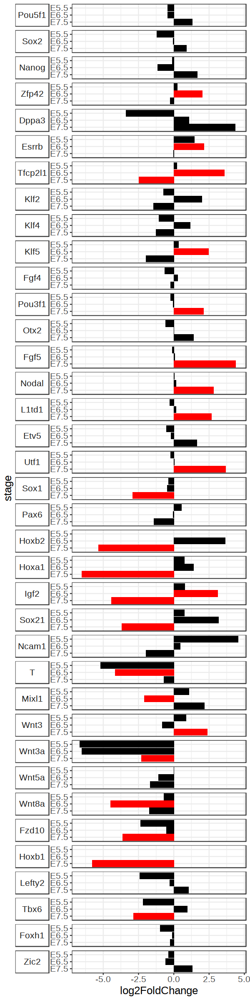

In [11]:
to.plot = rbindlist(DEgenes)
labels = to.plot[sig==TRUE,] %>% .[order(-abs(log2FoldChange)),] %>% .[,head(.SD, 15), by=stage]

to.plot = to.plot[gene %in% marker_type$gene] %>% merge(marker_type, by='gene') %>%
    .[,stage:=factor(stage, levels=c('E7.5', 'E6.5', 'E5.5'))] %>%
    .[,gene:=factor(gene, levels=marker_type$gene)]

options(repr.plot.width=5, repr.plot.height=20) 

ggplot(to.plot, aes(stage, log2FoldChange, fill=sig)) +
    geom_bar(stat='identity') + 
    scale_fill_manual(values = c('TRUE' = 'red', 'FALSE'='black')) +
    facet_grid(rows=vars(gene), switch = "y") + 
    #geom_hline(yintercept=0, col='black') + 
    theme_bw() + 
    coord_flip() + 
    theme(legend.position= 'none',
         #axis.text.x=element_text(angle=-45, hjust=0, vjust=1),
         strip.background = element_rect(fill='white'),
         strip.text.y.left = element_text(angle = 0),
         text=element_text(size=15),
         strip.placement = "outside")

Warning message:
“Removed 14149 rows containing missing values (geom_point).”


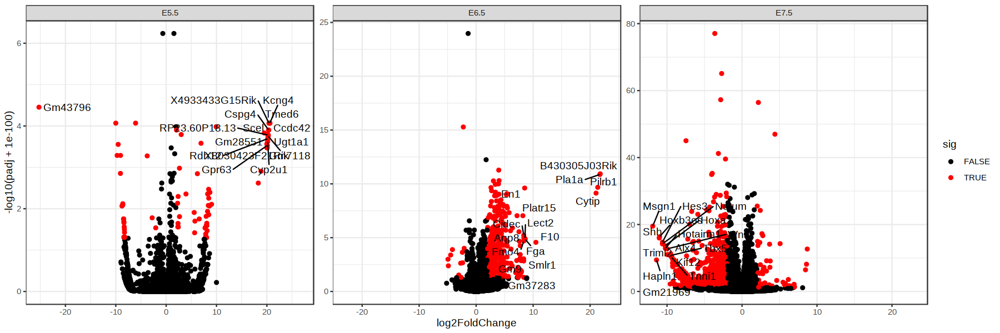

In [12]:
to.plot = rbindlist(DEgenes)
labels = to.plot[sig==TRUE,] %>% .[order(-abs(log2FoldChange)),] %>% .[,head(.SD, 15), by=stage]

options(repr.plot.width=15, repr.plot.height=5) 

ggplot(to.plot, aes(log2FoldChange, -log10(padj+1e-100), col=sig)) + 
    geom_point() + 
    scale_color_manual(values=c('black', 'red')) +
    ggrepel::geom_text_repel(data=labels, aes(x=log2FoldChange, y=-log10(padj+1e-100), label=gene), 
                             max.overlaps=Inf, size=4, col='black') +
    facet_wrap(~stage, scales='free') + 
    theme_bw()

In [13]:
normalized_counts = assay(rlog(ddsFullE567, blind = TRUE))

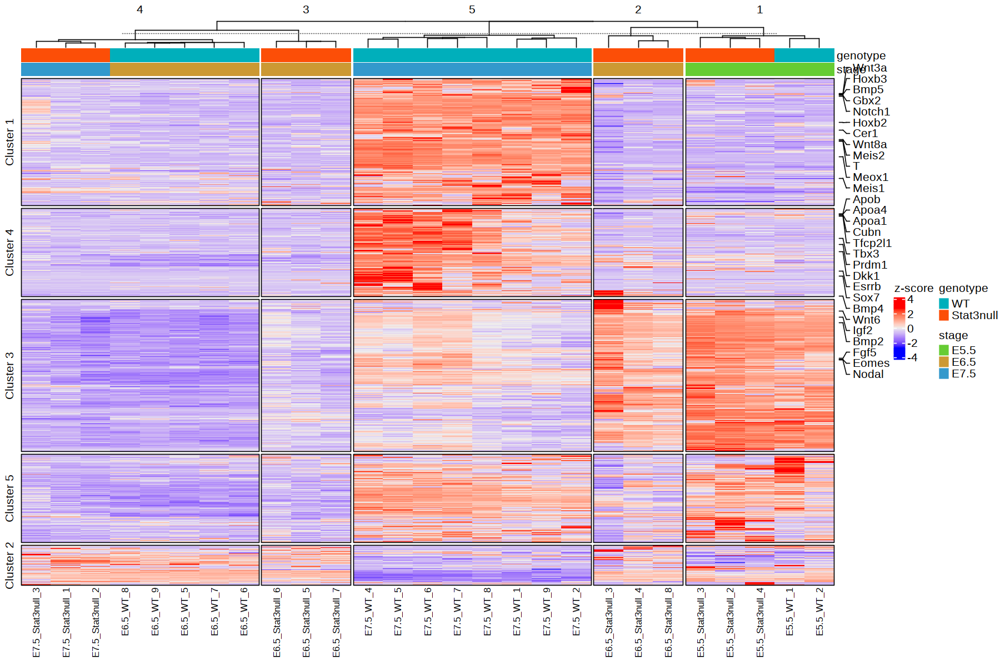

In [14]:
opts = list()
for(i in 5){ # after looking at clustering 1 to 10 gene clusters, 4 looks best
opts$nclust = i

# get normalized counts of genes that are significant in any of the timepoints
heatmap.mtx = normalized_counts[unique(to.plot[sig==TRUE, gene]), ]

heatmap_scaled.mtx <- t(scale(t(heatmap.mtx)))

#perform k-means with 4 centers and take a look at the gene-to-cluster assignment.
set.seed(1234)
kclus <- kmeans(heatmap_scaled.mtx, opts$nclust)

#use the split parameter of Heatmap() in order to split the heatmap based on the k-means result:
split <- paste0("Cluster ", kclus$cluster)
# fix order of the clusters to have 1 to 4, top to bottom
split <- factor(split, levels = paste0('Cluster ', 1:opts$nclust))


list = c("T", "Axin2", "Cer1", "Dkk1","Wnt3a", "Tbx3","Wnt6", "Wnt8a","Wnt5a", "Igf2", "Bmp2","Bmp4", "Bmp5", "Fgf5", "Fgf3","Fgf8", "Cer1", "Prdm1", "Nkx1-2", "Cubn", "Apoe1", "Spry4", "Tead1","Apob", "Id1","Apoa1", "Apoa4" , "Sox7", "Eomes", "Hoxb2", "Hoxb3","Gbx2", "Nodal", "Notch1", "Nanog", "Esrrb", "Tfcp2l1", "Meox1", "Meox2", "Meis1", "Meis2")
genelabs <- rowAnnotation(Genes = anno_mark(at=which(rownames(heatmap_scaled.mtx) %in% list), labels = rownames(heatmap_scaled.mtx)[which(rownames(heatmap_scaled.mtx) %in% list)]))


#top annotation
anno <- HeatmapAnnotation(df=colData(ddsFullE567)[, c("genotype", "stage")], 
                          col = list(genotype=c("WT"="#00afbb", "Stat3null"="#fc4e07"), 
                                     stage=c("E5.5"="#66cc33", "E6.5"="#cc9933", "E7.5"="#3399cc")),
                          annotation_legend_param = list(title_gp = gpar(fontsize = 12),
                                                         labels_gp = gpar(fontsize = 12)))


hm <- Heatmap(heatmap_scaled.mtx, 
              split = split, 
              name = "z-score", 
              top_annotation = anno,
            #  cluster_row_slices = FALSE, 
              cluster_rows = TRUE,
              column_split = ddsFullE567$cluster, 
              cluster_columns = TRUE,
              show_row_dend = FALSE, 
              row_gap = unit(1, "mm"), 
              column_gap = unit(1, "mm"), 
              border = TRUE, 
              row_title_gp = gpar(fontsize = 12),
              row_names_gp = gpar(fontsize = 10), 
              column_title_gp = gpar(fontsize = 12), 
              column_names_gp = gpar(fontsize = 10),
              heatmap_legend_param = list(title_gp=gpar(fontsize = 12),
                                          labels_gp=gpar(fontsize = 12)
                                          )
              )
pdf("Heatmap100522_c5.pdf", width = 7.5, height = 10)
draw(hm + genelabs)
dev.off()
    
options(repr.plot.width=15, repr.plot.height=10) 
draw(hm + genelabs)
}

In [15]:
# Turn matrix in to long format 
mtx_long = as.data.table(heatmap.mtx, keep.rownames=T) %>% 
    setnames('rn', 'gene') %>% 
    melt(id.vars = "gene",
         variable.name = "sample", value.name = "expr") %>%
    merge(as.data.table(colData, keep.rownames=T), by.x='sample', by.y='rn') %>%
    .[,mean_expr := mean(expr), by=c('group', 'gene')] %>% unique(by=c('group', 'gene')) %>%
    .[,cluster:=NULL] %>%
    merge(as.data.table(kclus$cluster,keep.rownames=T), by.x='gene', by.y='V1') %>% 
    setnames('V2', 'cluster') %>%
    .[,zscore:=scale(mean_expr), by='gene']

In [16]:
DEGenes = data.table(gene = rownames(heatmap_scaled.mtx), cluster = split)
entrez = mapIds(org.Mm.eg.db, DEGenes$gene, 'ENTREZID', 'SYMBOL')
DEGenes$entrez = entrez

'select()' returned 1:1 mapping between keys and columns



In [17]:
GO_terms = lapply(unique(DEGenes$cluster), function(x){
    go <- goana(DEGenes[cluster==x, entrez], species="Mm")
    GO = as.data.table(go, keep.rownames=T)[order(P.DE),] %>% .[Ont=='BP'] %>% head(10) %>%
        .[,Term:=factor(Term, levels=Term)] %>%
        .[,cluster:=x]
    
    return(GO)
    })

In [18]:
unique(mtx_long$cluster)

[1] 4 3 5 2 1

In [19]:
plot_expr = function(cl = 1){
    ggplot(mtx_long[cluster==cl], aes(stage, zscore, col=genotype, group=interaction(genotype, gene))) + 
        geom_line(data=mtx_long[genotype=='WT' & cluster==cl], size=0.1, col="#e6f6f7") + # 
        geom_line(data=mtx_long[genotype=='Stat3null' & cluster==cl], size=0.1, col="#fcdccf") + # 
        ggtitle(paste0('cluster ', cl)) + 
        stat_summary(aes(group=interaction(cluster, genotype)), fun='mean', geom="line",size=2) +
        scale_color_manual(values = c(WT="#00afbb", Stat3null="#fc4e07")) +
        scale_x_discrete(expand = c(0.05, 0)) + 
        theme_bw() + 
        theme(legend.position='left', 
              text=element_text(color='black', size=15),
              axis.title.x=element_blank()) # 
}

GO_terms.plot = GO_terms %>% rbindlist()

plot_go = function(cl = 1){
    ggplot(GO_terms.plot[cluster==paste0('Cluster ',cl)][order(-P.DE),][,Term:=factor(Term, levels=Term)], aes(Term, -log10(P.DE))) +
    geom_bar(stat='identity', col='black', fill=scales::hue_pal()(5)[cl]) + 
    coord_flip() + 
    ggtitle('') +
    theme_bw() + 
    theme(text=element_text(size=15),
         legend.position='none',
         axis.title.y=element_blank(),
         axis.text.y=element_text(color='black'),
         axis.title.x=element_blank())
}

In [20]:
# x = org.Mm.egGO
# mapped_genes <- mappedkeys(x)
# xx <- as.list(org.Mm.egGO2EG)
# head(xx)

In [21]:
library(patchwork)
options(repr.plot.width=15, repr.plot.height=4) 

plots = list()
for(i in 1:opts$nclust){
    p1 = plot_expr(i)
    plots[[i]] = p1
}

goplots = list()
for(i in 1:opts$nclust){
    p2 = plot_go(i)
    goplots[[i]] = p2
}

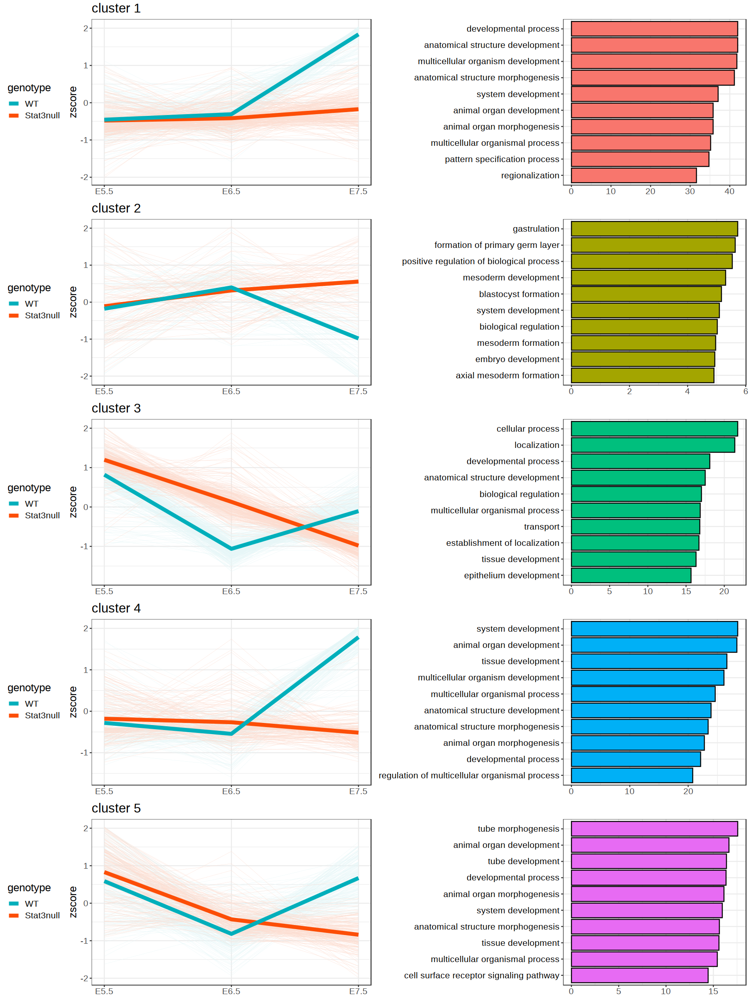

In [22]:
p_expr = ggarrange(plotlist = plots, ncol=1, align ='v')
p_go = ggarrange(plotlist = goplots, ncol=1, align ='v')
options(repr.plot.width=15, repr.plot.height=20) 

ggarrange(p_expr,p_go)

'select()' returned 1:1 mapping between keys and columns

'select()' returned 1:1 mapping between keys and columns

'select()' returned 1:1 mapping between keys and columns

'select()' returned 1:1 mapping between keys and columns

'select()' returned 1:1 mapping between keys and columns

'select()' returned 1:1 mapping between keys and columns



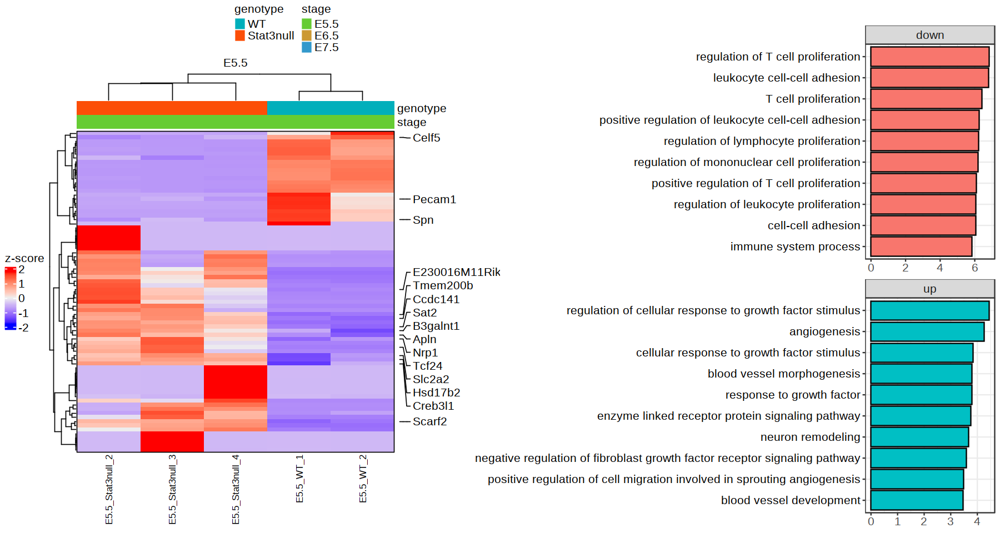

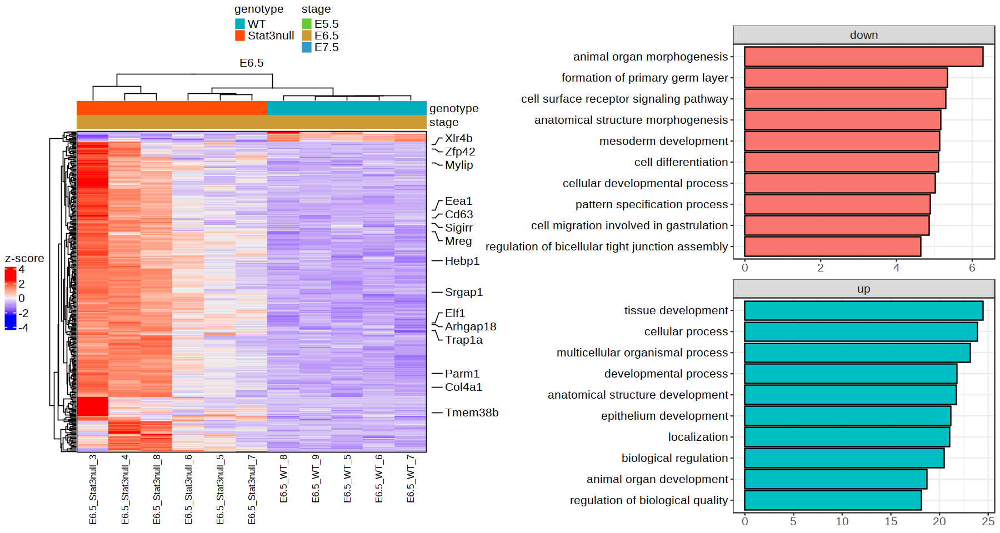

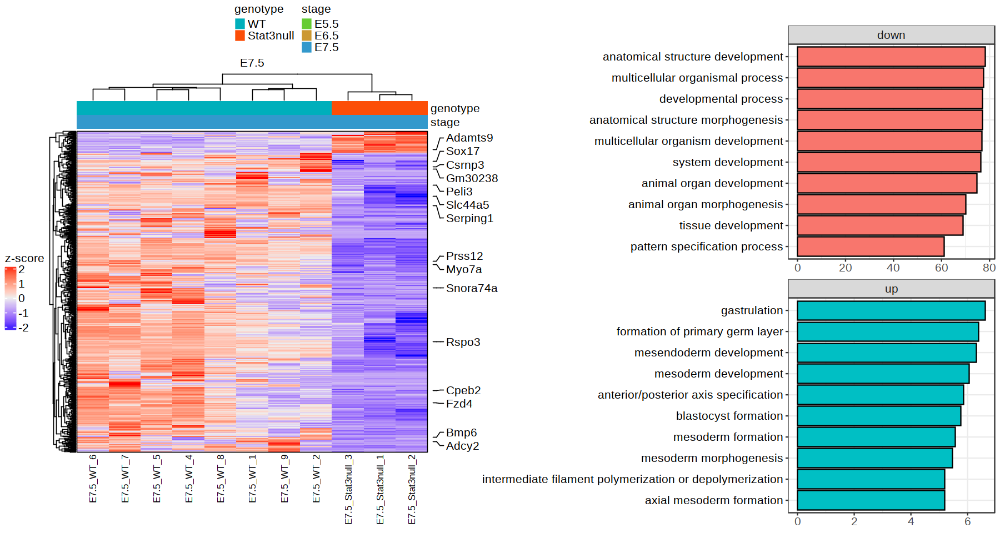

In [23]:
# Per timepoint
for(i in unique(to.plot$stage)){
tp = i
to.plot_tmp = to.plot[stage==tp & sig == TRUE]

# heatmap
heatmap.mtx = normalized_counts[unique(to.plot_tmp[sig==TRUE, gene]), grep(tp, colnames(normalized_counts))]

heatmap_scaled.mtx <- t(scale(t(heatmap.mtx)))

genes = to.plot_tmp[order(abs(log2FoldChange)),]$gene %>% head(15)
genelabs <- rowAnnotation(Genes = anno_mark(at=which(rownames(heatmap_scaled.mtx) %in% genes), labels = rownames(heatmap_scaled.mtx)[which(rownames(heatmap_scaled.mtx) %in% genes)]))

#top annotation
anno <- HeatmapAnnotation(df=colData(ddsFullE567)[colData(ddsFullE567)$stage==tp, c("genotype", "stage")], 
                          col = list(genotype=c("WT"="#00afbb", "Stat3null"="#fc4e07"), 
                                     stage=c("E5.5"="#66cc33", "E6.5"="#cc9933", "E7.5"="#3399cc")),
                          annotation_legend_param = list(title_gp = gpar(fontsize = 12),
                                                         labels_gp = gpar(fontsize = 12)))

hm = Heatmap(heatmap_scaled.mtx,
        column_title = i,
        name = "z-score", 
        top_annotation=anno,
        row_gap = unit(1, "mm"), 
        column_gap = unit(1, "mm"), 
        border = TRUE, 
        row_title_gp = gpar(fontsize = 12),
        row_names_gp = gpar(fontsize = 10), 
        column_title_gp = gpar(fontsize = 12), 
        column_names_gp = gpar(fontsize = 10),
        heatmap_legend_param = list(title_gp=gpar(fontsize = 12),
        labels_gp=gpar(fontsize = 12)
))

# GO
up = to.plot_tmp[log2FoldChange>0, gene]
entrez = mapIds(org.Mm.eg.db, up, 'ENTREZID', 'SYMBOL')
up_entrez = entrez
up_GO = as.data.table(goana(up_entrez, species="Mm"), 
                      keep.rownames=T)[order(P.DE),] %>% .[Ont=='BP'] %>% head(10) %>%
    .[,Term:=factor(Term, levels=Term)] %>%
    .[,direction:='up']

down = to.plot_tmp[log2FoldChange<0, gene]
entrez = mapIds(org.Mm.eg.db, down, 'ENTREZID', 'SYMBOL')
down_entrez = entrez
down_GO = as.data.table(goana(down_entrez, species="Mm"), 
                      keep.rownames=T)[order(P.DE),] %>% .[Ont=='BP'] %>% head(10) %>%
    .[,Term:=factor(Term, levels=Term)] %>% 
    .[,direction:='down']

GO_terms.plot = rbind(up_GO, down_GO)

GO_plot = ggplot(GO_terms.plot[order(-P.DE),][,Term:=factor(Term, levels=Term)], aes(Term, -log10(P.DE), fill=direction)) +
    geom_bar(stat='identity', col='black') + 
    coord_flip() + 
    ggtitle('') +
    theme_bw() + 
    facet_wrap(~direction, scales='free', ncol=1) + 
    theme(text=element_text(size=15),
         legend.position='none',
         axis.title.y=element_blank(),
         axis.text.y=element_text(color='black'),
         axis.title.x=element_blank())

options(repr.plot.width=15, repr.plot.height=8) 
print(ggarrange(grid.grabExpr(draw(hm + genelabs, 
                             annotation_legend_side = "top", 
                             heatmap_legend_side = "left")), 
          GO_plot))
}

#### Determine where in Embryo DEGs are expressed

In [24]:
# Load seurat object
seurat = readRDS("/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/gastrulation/pijuansala2019_gastrulation10x/processed/seurat.rds")
seurat <- NormalizeData(seurat, normalization.method = "LogNormalize")

logcounts = seurat@assays$RNA@data

In [25]:
# Extract umap coordinates
umap = seurat@meta.data[, c('umapX', 'umapY')]
umap$umapX = round(as.numeric(umap$umapX),2)
umap$umapY = round(as.numeric(umap$umapY),2)
colnames(umap) = c('umap_1', 'umap_2')

In [26]:
plot_gene = function(gene){
    ggplot(umap, aes(umap_1, umap_2, col=as.vector(logcounts[gene,])))  + 
        geom_point(size=0.01) + 
        scale_colour_gradient(low='gray90', high='blue', name=gene) +
        ggtitle(gene) + 
        theme_void()
}

In [27]:
to.plot = to.plot[gene %in% rownames(logcounts)]

[1] "E5.5"


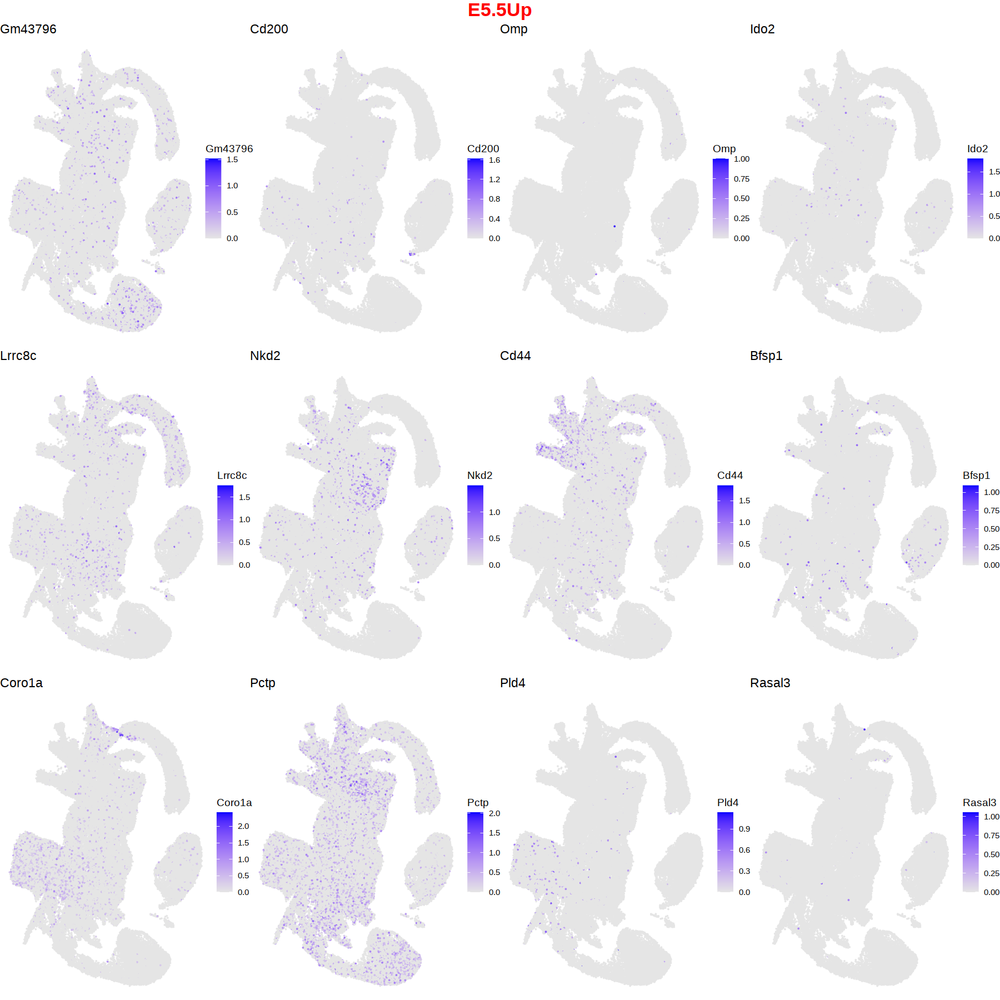

[1] "E6.5"


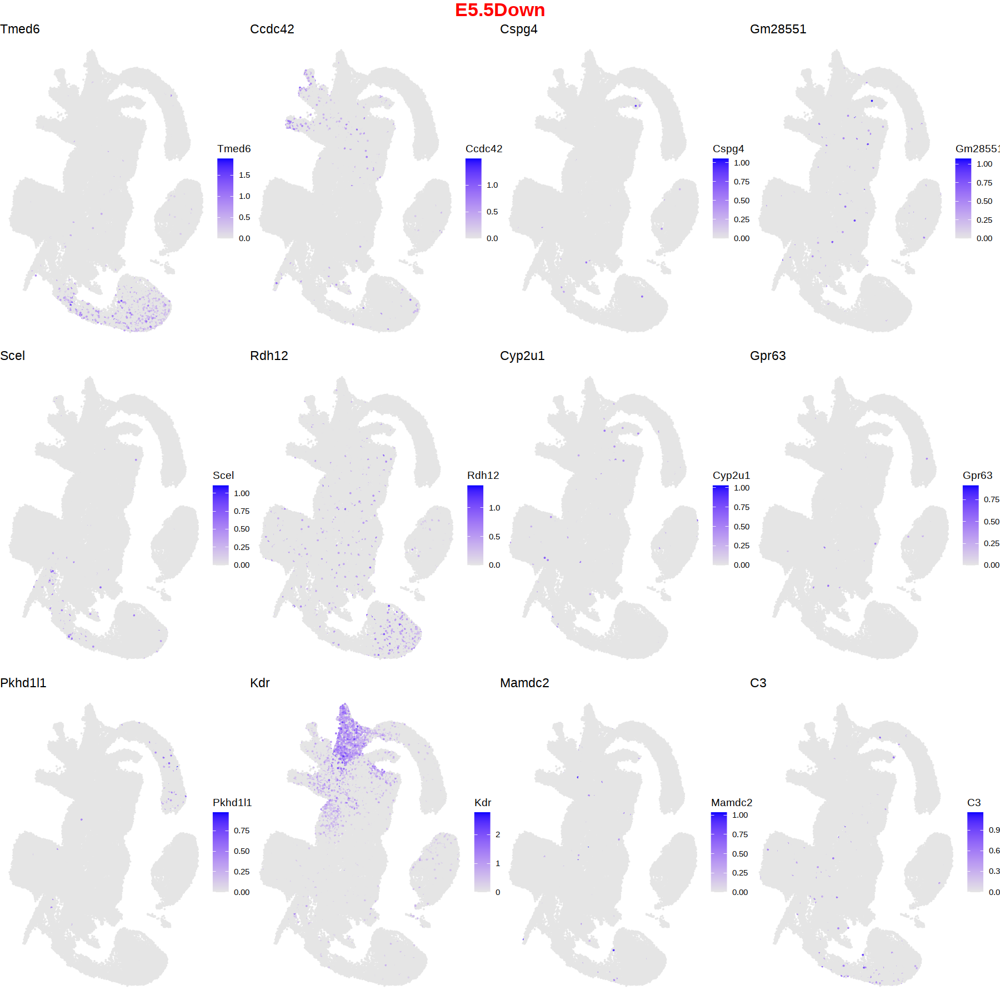

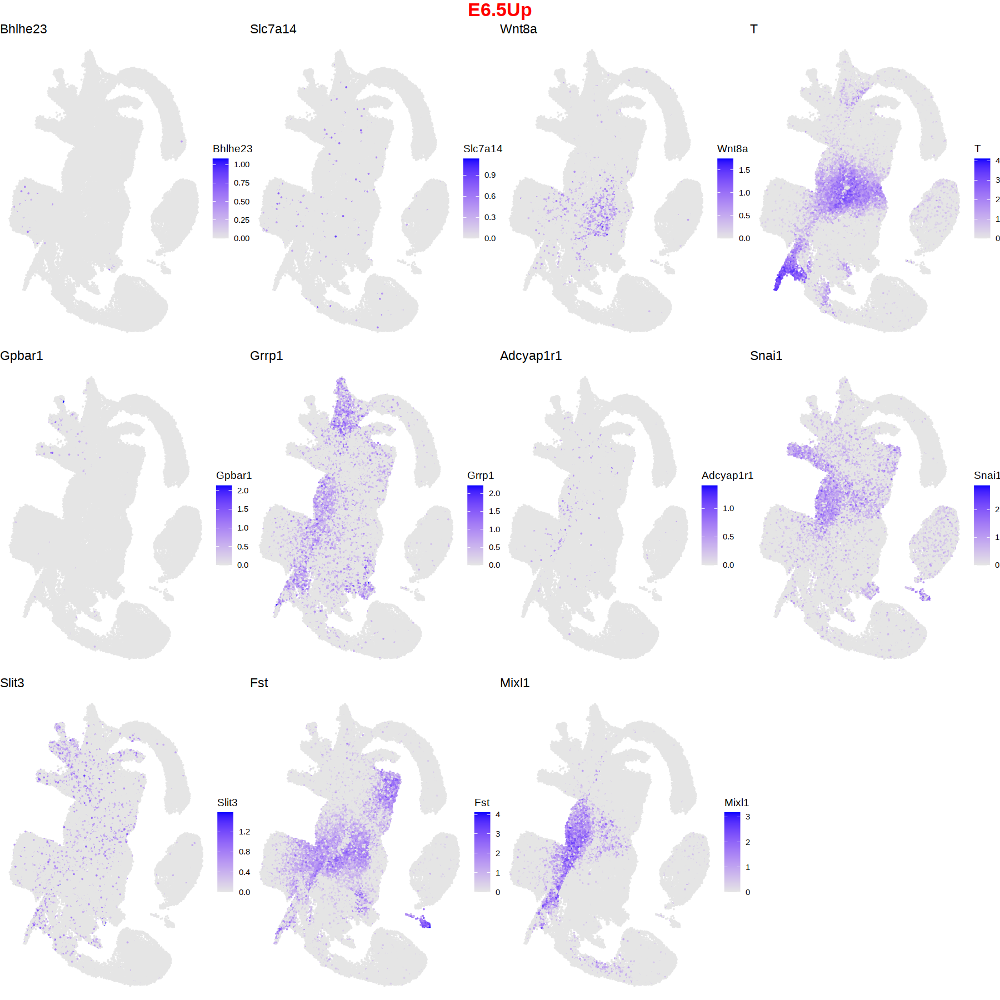

[1] "E7.5"


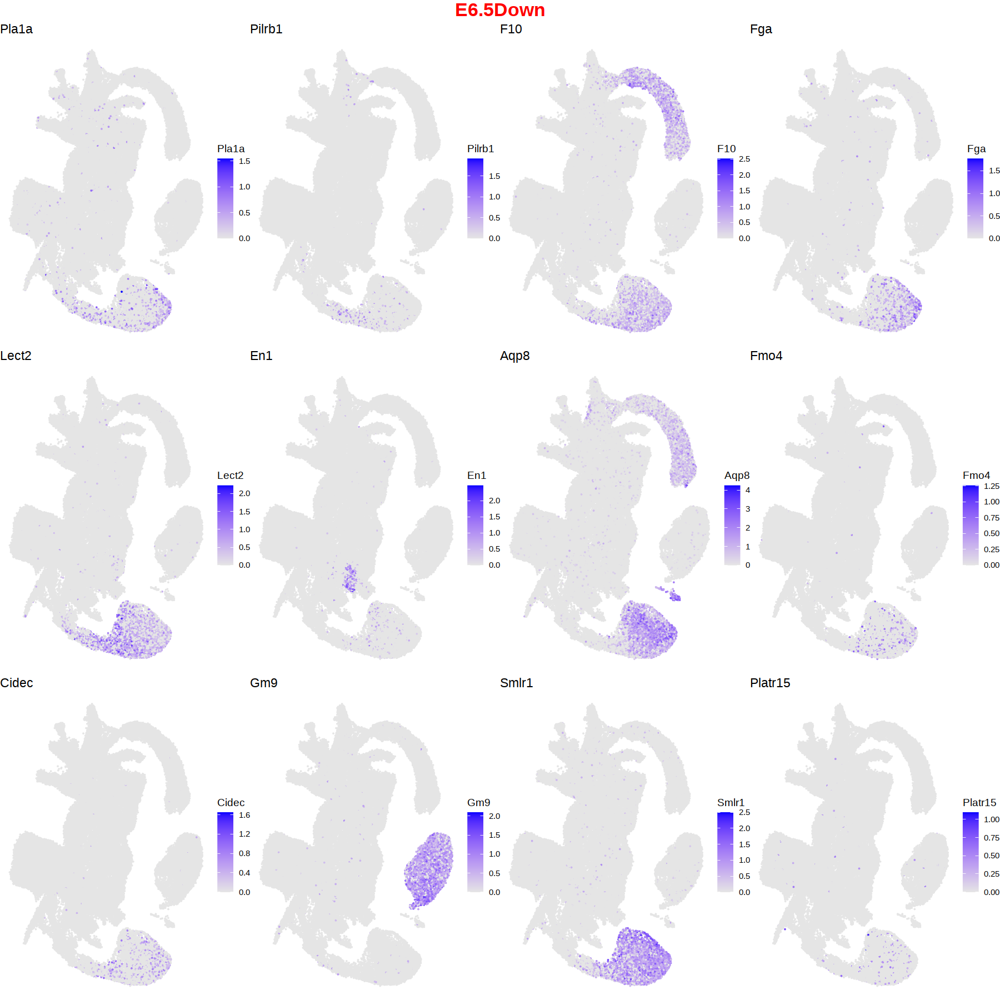

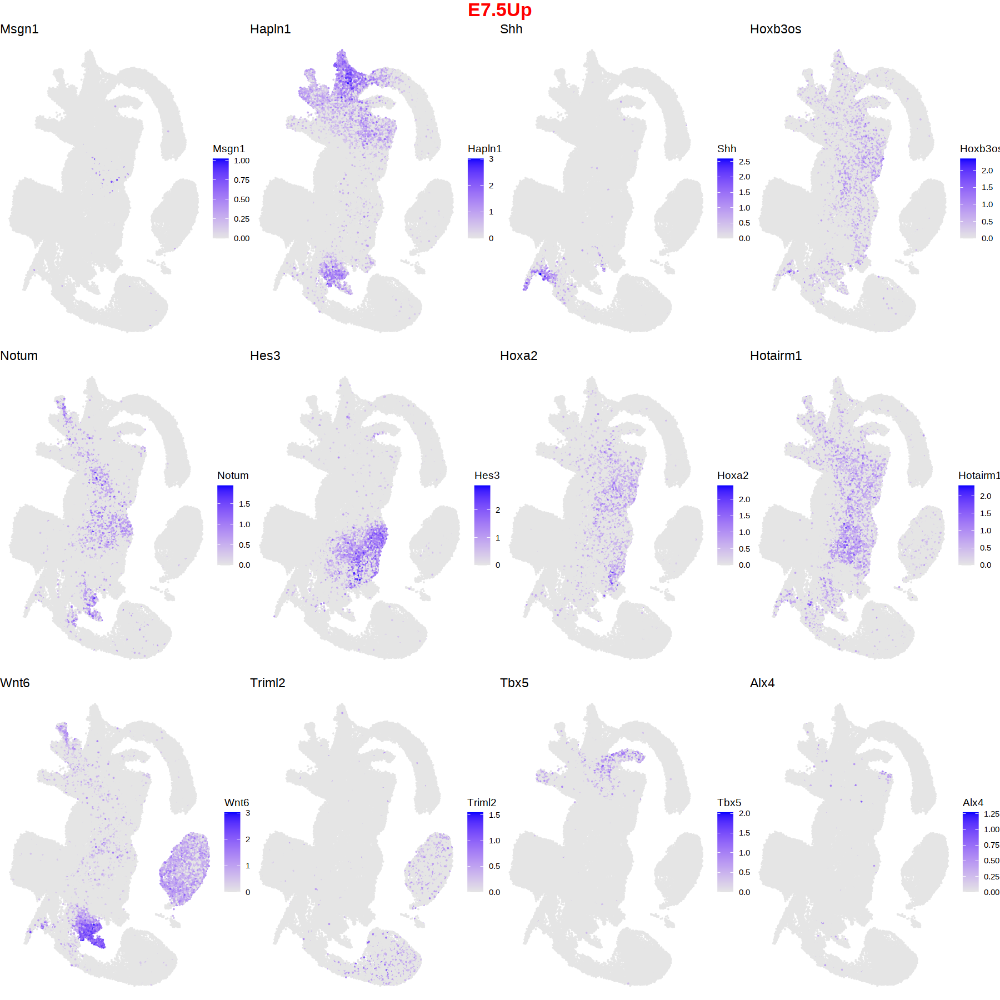

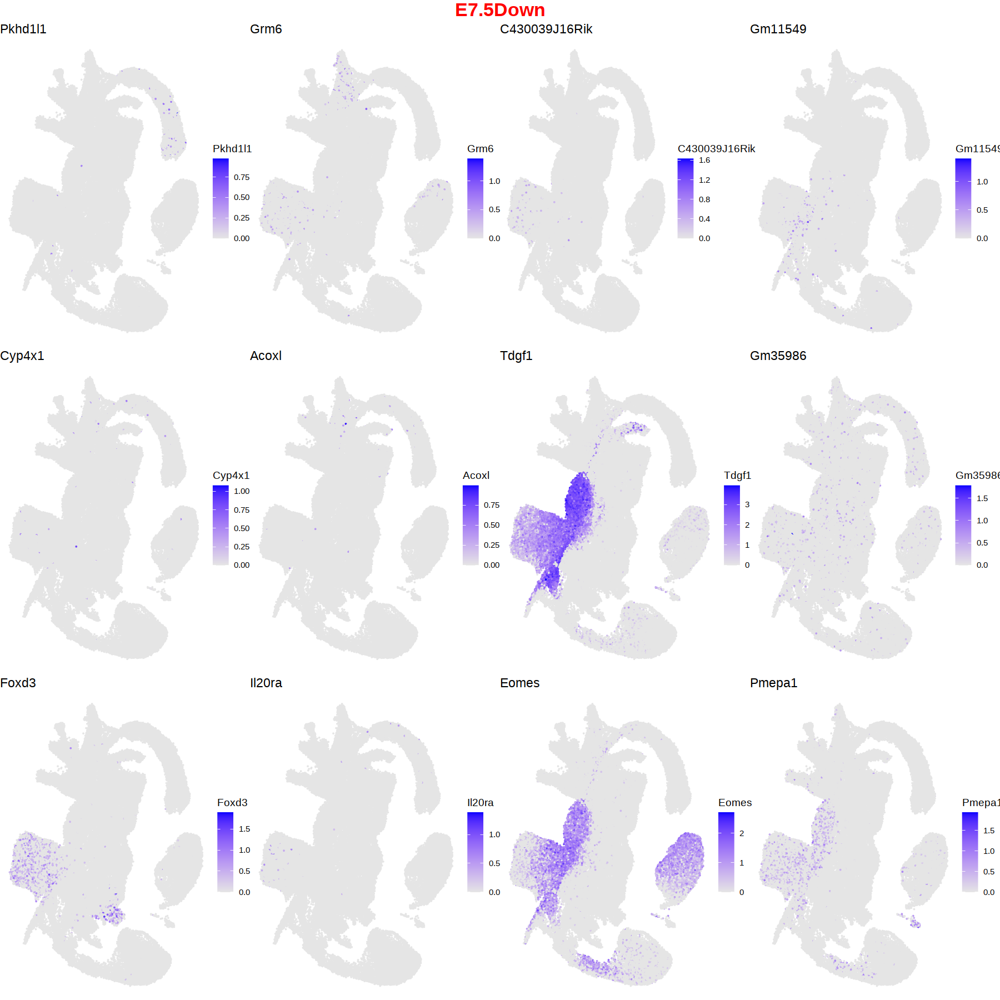

In [28]:
options(repr.plot.width=15, repr.plot.height=15) 

for(i in c('E5.5', 'E6.5', 'E7.5')){ #
    print(i)
    up = to.plot[stage == i & sig==TRUE & log2FoldChange<0] %>% 
        .[order(-abs(log2FoldChange)),gene] %>% 
        head(12)
    
    down = to.plot[stage == i  & sig==TRUE & log2FoldChange>0] %>% 
        .[order(-abs(log2FoldChange)),gene] %>% 
        head(12)
    
    up.plots = annotate_figure(ggarrange(plotlist=lapply(up, plot_gene)), top = text_grob(paste0(i, " Up"), 
               color = "red", face = "bold", size = 20))
    down.plots = annotate_figure(ggarrange(plotlist=lapply(down, plot_gene)), top = text_grob(paste0(i, " Down"), 
               color = "red", face = "bold", size = 20))
    print(up.plots)
    print(down.plots)
}

# EdgeR approach

In [22]:
library(edgeR)

In [23]:
countData <- as.matrix(read.csv('gene_count_matrix_epiblast.csv', row.names = 'gene_id'))
rownames(countData) = rownames(countData) %>% strsplit('[|]') %>% map(2) # change rownames

colData <- read.csv('phenodata_epi2.csv', row.names = 1)
colData$genotype = gsub("-/-", "null", colData$genotype)
colData$group = paste0(colData$genotype, '_',colData$stage)

In [24]:
#E5.5, E6.5, E7.5
##Remove ex5.5 results
#select E7.5 data
colE567 <- colData[colData$stage!="ex5.5",]
#remove E7.5_WT_3
colE567 <- colE567[!rownames(colE567) %in% c("E5.5_Stat3null_1", "E6.5_Stat3null_1", "E6.5_Stat3null_2", "E6.5_WT_1", "E6.5_WT_2", "E6.5_WT_3", "E6.5_WT_4", "E7.5_WT_3"), ]
colE567$genotype <- factor(colE567$genotype, levels = c("WT", "Stat3null"))
countDataE567 <- countData[, rownames(colE567)]

countDataE567 <- countDataE567[rowSums(countDataE567) > 0, ]
rownames(countDataE567) = make.names(rownames(countDataE567), unique=TRUE)

In [25]:
stage = colnames(countDataE567) %>% strsplit('_') %>% map(1) %>% unlist()
genotype = colnames(countDataE567) %>% strsplit('_') %>% map(2) %>% unlist()

In [26]:
y <- DGEList(counts=countDataE567, group=genotype)
keep <- filterByExpr(y)

table(keep)
y <- y[keep, , keep.lib.sizes=FALSE]

y <- calcNormFactors(y)


keep
FALSE  TRUE 
14433 17507 

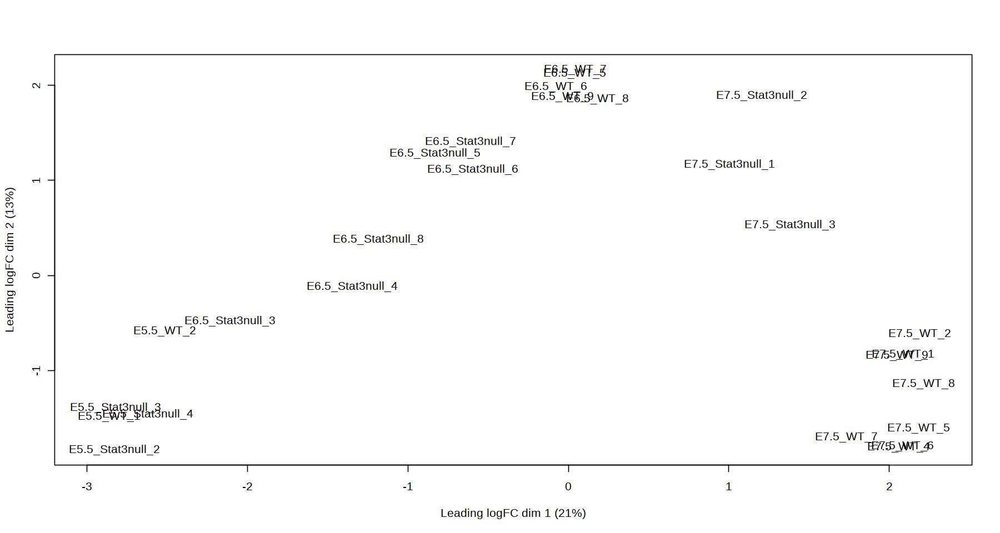

In [27]:
plotMDS(y)

In [28]:
design <- model.matrix(~stage+genotype)
rownames(design) <- colnames(y)
head(design)


,(Intercept),stageE6.5,stageE7.5,genotypeWT
E5.5_Stat3null_2,1,0,0,0
E5.5_Stat3null_3,1,0,0,0
E5.5_Stat3null_4,1,0,0,0
E5.5_WT_1,1,0,0,1
E5.5_WT_2,1,0,0,1
E6.5_Stat3null_3,1,1,0,0


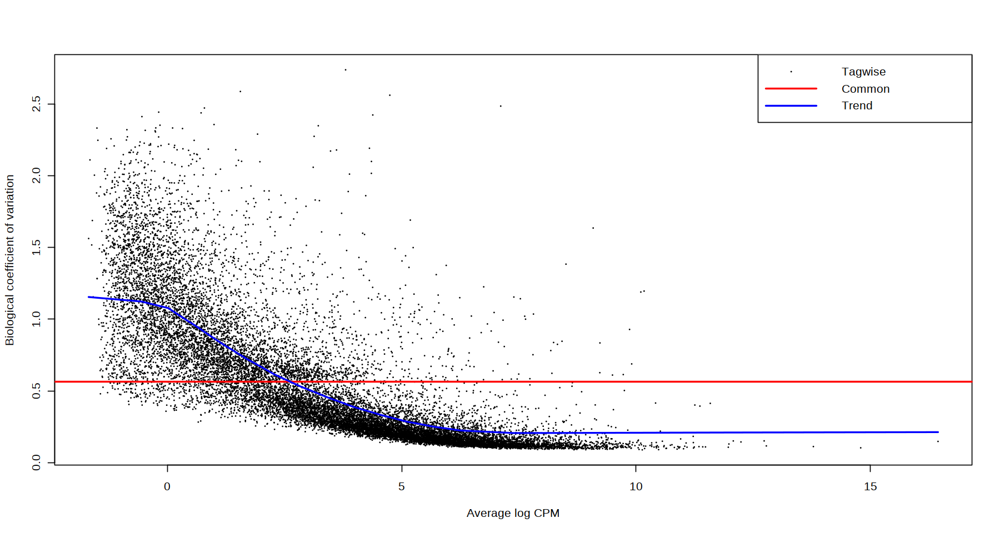

In [29]:
y <- estimateDisp(y, design, robust=TRUE)
plotBCV(y)

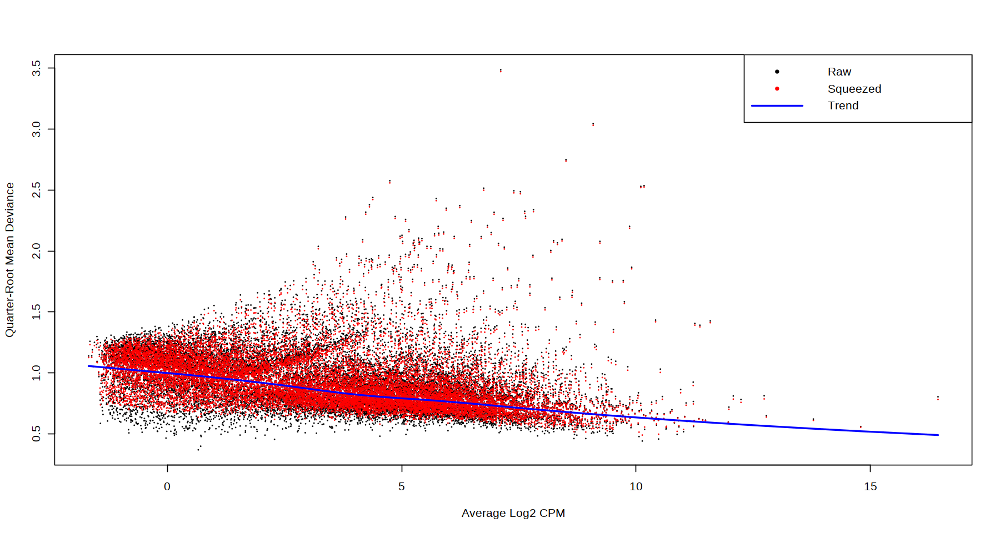

In [30]:
fit <- glmQLFit(y, design, robust=TRUE)
plotQLDisp(fit)

In [31]:
# 7483 genes differentially expressed over time
qlf <- glmQLFTest(fit, coef=2:3)
FDR <- p.adjust(qlf$table$PValue, method="BH")
sum(FDR < 0.05)

[1] 7483

       1*genotypeWT
Down              5
NotSig        17477
Up               25

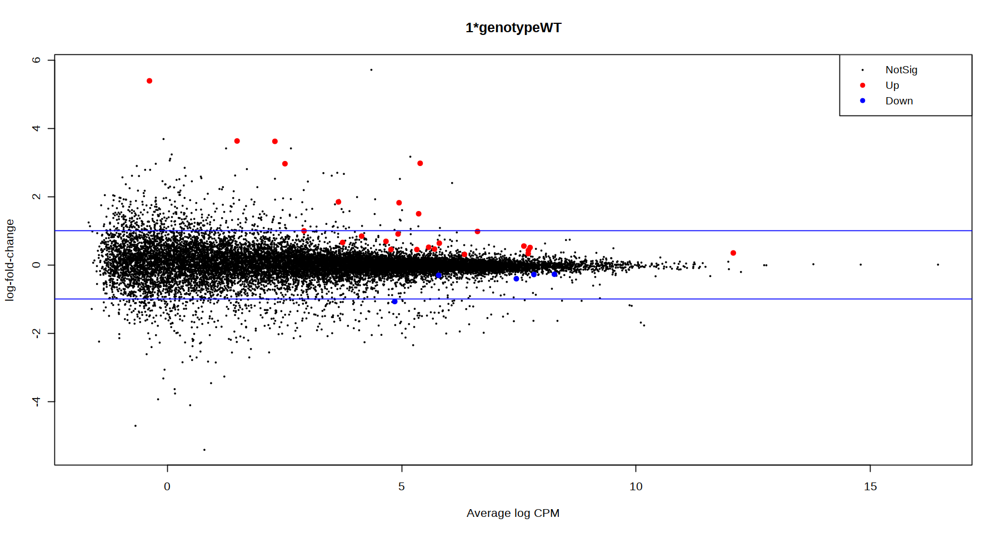

In [32]:
qlf <- glmQLFTest(fit, contrast=c(0,0,0,1))
summary(decideTests(qlf))
plotMD(qlf)
abline(h=c(-1,1), col="blue")


       1*genotypeWT
Down              5
NotSig        17477
Up               25

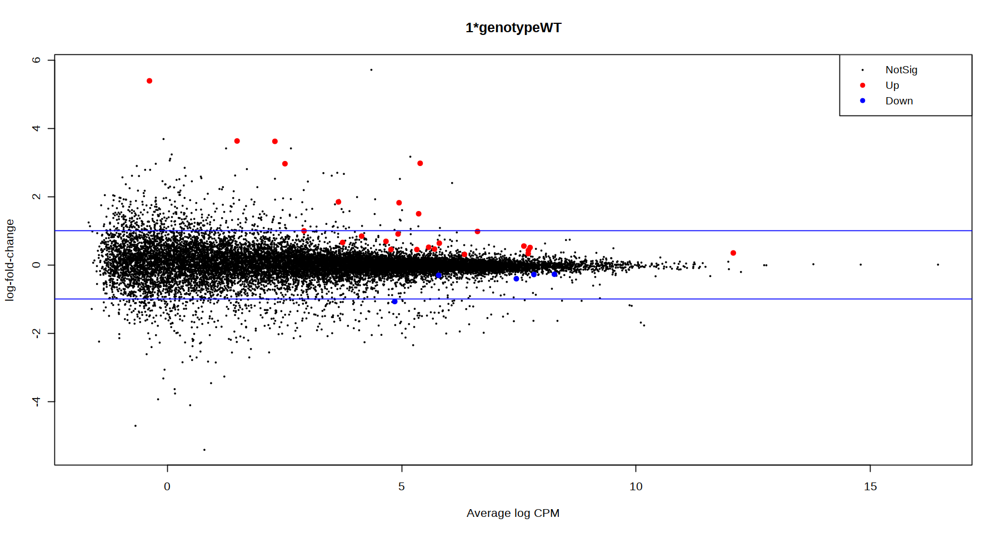

In [33]:
qlf <- glmQLFTest(fit, contrast=c(0,0,0,1))
summary(decideTests(qlf))
plotMD(qlf)
abline(h=c(-1,1), col="blue")


In [34]:
tp = 'E7.5'
metatmp = colE567[colE567$stage==tp,]
ytmp = y[,rownames(metatmp)]
design <- model.matrix(~metatmp$genotype)
rownames(design) <- colnames(ytmp)

ytmp <- estimateDisp(ytmp, design, robust=TRUE)
fit <- glmQLFit(ytmp, design, robust=TRUE)

qlf <- glmQLFTest(fit)

In [35]:
to.plot = as.data.table(qlf$table, keep.rownames=T) %>%
    .[,sig:=ifelse(abs(logFC)>2 & PValue<0.05, TRUE, FALSE)] %>% setnames('rn', 'gene')

labels = to.plot[sig==TRUE,] %>% .[order(-abs(logFC)),] %>% .[,head(.SD, 35)]


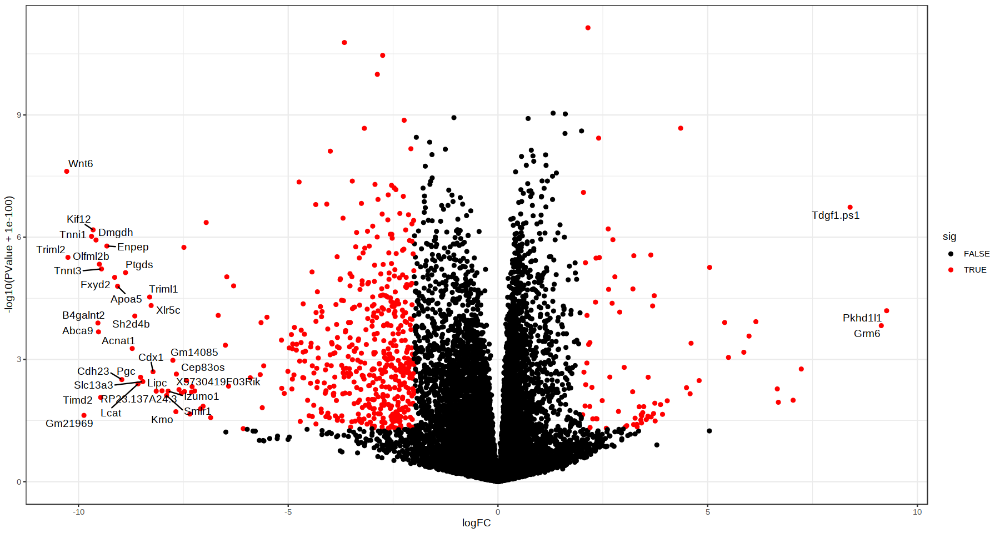

In [36]:
ggplot(to.plot, aes(logFC, -log10(PValue+1e-100), col=sig)) + 
    geom_point() + 
    scale_color_manual(values=c('black', 'red')) +
    ggrepel::geom_text_repel(data=labels, aes(x=logFC, y=-log10(PValue+1e-100), label=gene), 
                             max.overlaps=Inf, size=4, col='black') +
 #   facet_wrap(~stage, scales='free') + 
    theme_bw()

In [37]:
# DEseq per stage
DEgenes = lapply(unique(colE567$stage), function(x){ # only on first one as test
    metatmp = colE567[colE567$stage==x,]
    ytmp = y[,rownames(metatmp)]
    design <- model.matrix(~metatmp$genotype)
    rownames(design) <- colnames(ytmp)

    ytmp <- estimateDisp(ytmp, design, robust=TRUE)
    fit <- glmQLFit(ytmp, design, robust=TRUE)

    qlf <- glmQLFTest(fit)
    
    # Multiple comparison, but doesn't seem quite right yet
    tr <- glmTreat(fit, coef=2, lfc=2)
    
    res = as.data.table(tr$table, keep.rownames=T) %>%
        setnames('rn', 'gene') %>%
        .[, sig:=PValue <= padj_thr & abs(logFC) >= LFC_thr & !is.na(PValue)] %>%
        .[, stage:=x]
  return(res)
})    

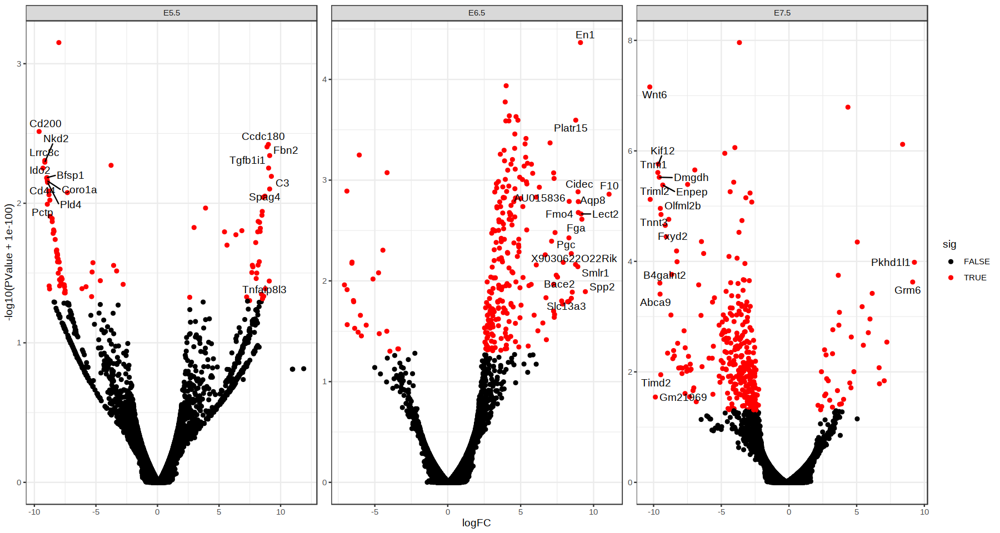

In [38]:
to.plot = rbindlist(DEgenes)
labels = to.plot[sig==TRUE,] %>% .[order(-abs(logFC)),] %>% .[,head(.SD, 15), by=stage]

ggplot(to.plot, aes(logFC, -log10(PValue+1e-100), col=sig)) + 
    geom_point() + 
    scale_color_manual(values=c('black', 'red')) +
    ggrepel::geom_text_repel(data=labels, aes(x=logFC, y=-log10(PValue+1e-100), label=gene), 
                             max.overlaps=Inf, size=4, col='black') +
    facet_wrap(~stage, scales='free') + 
    theme_bw()

In [39]:
normalized_counts = assay(rlog(ddsFullE567, blind = TRUE))

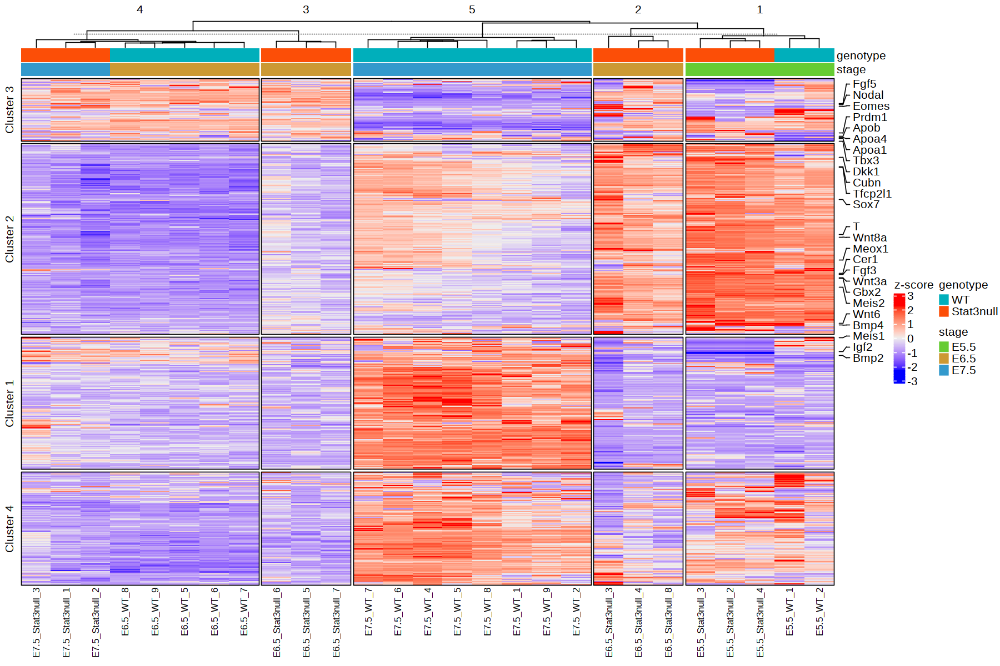

In [40]:
opts = list()
for(i in 4){ # after looking at clustering 1 to 10 gene clusters, 4 looks best
opts$nclust = i

# get normalized counts of genes that are significant in any of the timepoints
heatmap.mtx = normalized_counts[unique(to.plot[sig==TRUE, gene]), ]

heatmap_scaled.mtx <- t(scale(t(heatmap.mtx)))

#perform k-means with 4 centers and take a look at the gene-to-cluster assignment.
set.seed(1234)
kclus <- kmeans(heatmap_scaled.mtx, opts$nclust)

#use the split parameter of Heatmap() in order to split the heatmap based on the k-means result:
split <- paste0("Cluster ", kclus$cluster)
# fix order of the clusters to have 1 to 4, top to bottom
split <- factor(split, levels = paste0('Cluster ', 1:opts$nclust))


list = c("T", "Axin2", "Cer1", "Dkk1","Wnt3a", "Tbx3","Wnt6", "Wnt8a","Wnt5a", "Igf2", "Bmp2","Bmp4", "Bmp5", "Fgf5", "Fgf3","Fgf8", "Cer1", "Prdm1", "Nkx1-2", "Cubn", "Apoe1", "Spry4", "Tead1","Apob", "Id1","Apoa1", "Apoa4" , "Sox7", "Eomes", "Hoxb2", "Hoxb3","Gbx2", "Nodal", "Notch1", "Nanog", "Esrrb", "Tfcp2l1", "Meox1", "Meox2", "Meis1", "Meis2")
genelabs <- rowAnnotation(Genes = anno_mark(at=which(rownames(heatmap_scaled.mtx) %in% list), labels = rownames(heatmap_scaled.mtx)[which(rownames(heatmap_scaled.mtx) %in% list)]))


#top annotation
anno <- HeatmapAnnotation(df=colData(ddsFullE567)[, c("genotype", "stage")], 
                          col = list(genotype=c("WT"="#00afbb", "Stat3null"="#fc4e07"), 
                                     stage=c("E5.5"="#66cc33", "E6.5"="#cc9933", "E7.5"="#3399cc")),
                          annotation_legend_param = list(title_gp = gpar(fontsize = 12),
                                                         labels_gp = gpar(fontsize = 12)))


hm <- Heatmap(heatmap_scaled.mtx, 
              split = split, 
              name = "z-score", 
              top_annotation = anno,
            #  cluster_row_slices = FALSE, 
              cluster_rows = TRUE,
              column_split = ddsFullE567$cluster, 
              cluster_columns = TRUE,
              show_row_dend = FALSE, 
              row_gap = unit(1, "mm"), 
              column_gap = unit(1, "mm"), 
              border = TRUE, 
              row_title_gp = gpar(fontsize = 12),
              row_names_gp = gpar(fontsize = 10), 
              column_title_gp = gpar(fontsize = 12), 
              column_names_gp = gpar(fontsize = 10),
              heatmap_legend_param = list(title_gp=gpar(fontsize = 12),
                                          labels_gp=gpar(fontsize = 12)
                                          )
              )
pdf("Heatmap100522_c5.pdf", width = 7.5, height = 10)
draw(hm + genelabs)
dev.off()
    
options(repr.plot.width=15, repr.plot.height=10) 
draw(hm + genelabs)
}

In [41]:
mtx_long = as.data.table(heatmap.mtx, keep.rownames=T) %>% 
    setnames('rn', 'gene') %>% 
    melt(id.vars = "gene",
         variable.name = "sample", value.name = "expr") %>%
    merge(as.data.table(colData, keep.rownames=T), by.x='sample', by.y='rn') %>%
    .[,mean_expr := mean(expr), by=c('group', 'gene')] %>% unique(by=c('group', 'gene')) %>%
    .[,cluster:=NULL] %>%
    merge(as.data.table(kclus$cluster,keep.rownames=T), by.x='gene', by.y='V1') %>% 
    setnames('V2', 'cluster') %>%
    .[,zscore:=scale(mean_expr), by='gene']

head(mtx_long)

gene,sample,expr,stage,genotype,group,mean_expr,cluster,zscore
<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<dbl>,<int>,<dbl>
A4galt,E5.5_Stat3null_2,8.543199,E5.5,Stat3null,Stat3null_E5.5,8.655001,2,0.87868522
A4galt,E5.5_WT_1,9.249623,E5.5,WT,WT_E5.5,9.045691,2,1.25335575
A4galt,E6.5_Stat3null_3,8.193027,E6.5,Stat3null,Stat3null_E6.5,7.833695,2,0.09105524
A4galt,E6.5_WT_5,6.758043,E6.5,WT,WT_E6.5,6.507111,2,-1.18113607
A4galt,E7.5_Stat3null_1,6.808787,E7.5,Stat3null,Stat3null_E7.5,6.573850,2,-1.11713345
A4galt,E7.5_WT_1,8.377942,E7.5,WT,WT_E7.5,7.817134,2,0.07517332


In [42]:
DEGenes = data.table(gene = rownames(heatmap_scaled.mtx), cluster = split)
entrez = mapIds(org.Mm.eg.db, DEGenes$gene, 'ENTREZID', 'SYMBOL')
DEGenes$entrez = entrez

'select()' returned 1:1 mapping between keys and columns



In [43]:
GO_terms = lapply(unique(DEGenes$cluster), function(x){
    go <- goana(DEGenes[cluster==x, entrez], species="Mm")
    GO = as.data.table(go, keep.rownames=T)[order(P.DE),] %>% .[Ont=='BP'] %>% head(10) %>%
        .[,Term:=factor(Term, levels=Term)] %>%
        .[,cluster:=x]
    
    return(GO)
    })

In [44]:
unique(mtx_long$cluster)

[1] 2 3 4 1

In [45]:
plot_expr = function(cl = 1){
    ggplot(mtx_long[cluster==cl], aes(stage, zscore, col=genotype, group=interaction(genotype, gene))) + 
        geom_line(data=mtx_long[genotype=='WT' & cluster==cl], size=0.1, col="#e6f6f7") + # 
        geom_line(data=mtx_long[genotype=='Stat3null' & cluster==cl], size=0.1, col="#fcdccf") + # 
        ggtitle(paste0('cluster ', cl)) + 
        stat_summary(aes(group=interaction(cluster, genotype)), fun='mean', geom="line",size=2) +
        scale_color_manual(values = c(WT="#00afbb", Stat3null="#fc4e07")) +
        scale_x_discrete(expand = c(0.05, 0)) + 
        theme_bw() + 
        theme(legend.position='left', 
              text=element_text(color='black', size=15),
              axis.title.x=element_blank()) # 
}

GO_terms.plot = GO_terms %>% rbindlist()

plot_go = function(cl = 1){
    ggplot(GO_terms.plot[cluster==paste0('Cluster ',cl)][order(-P.DE),][,Term:=factor(Term, levels=Term)], aes(Term, -log10(P.DE))) +
    geom_bar(stat='identity', col='black', fill=scales::hue_pal()(5)[cl]) + 
    coord_flip() + 
    ggtitle('') +
    theme_bw() + 
    theme(text=element_text(size=15),
         legend.position='none',
         axis.title.y=element_blank(),
         axis.text.y=element_text(color='black'),
         axis.title.x=element_blank())
}

In [46]:
# x = org.Mm.egGO
# mapped_genes <- mappedkeys(x)
# xx <- as.list(org.Mm.egGO2EG)
# head(xx)

In [47]:
library(patchwork)
options(repr.plot.width=15, repr.plot.height=4) 

plots = list()
for(i in 1:opts$nclust){
    p1 = plot_expr(i)
    plots[[i]] = p1
}

goplots = list()
for(i in 1:opts$nclust){
    p2 = plot_go(i)
    goplots[[i]] = p2
}

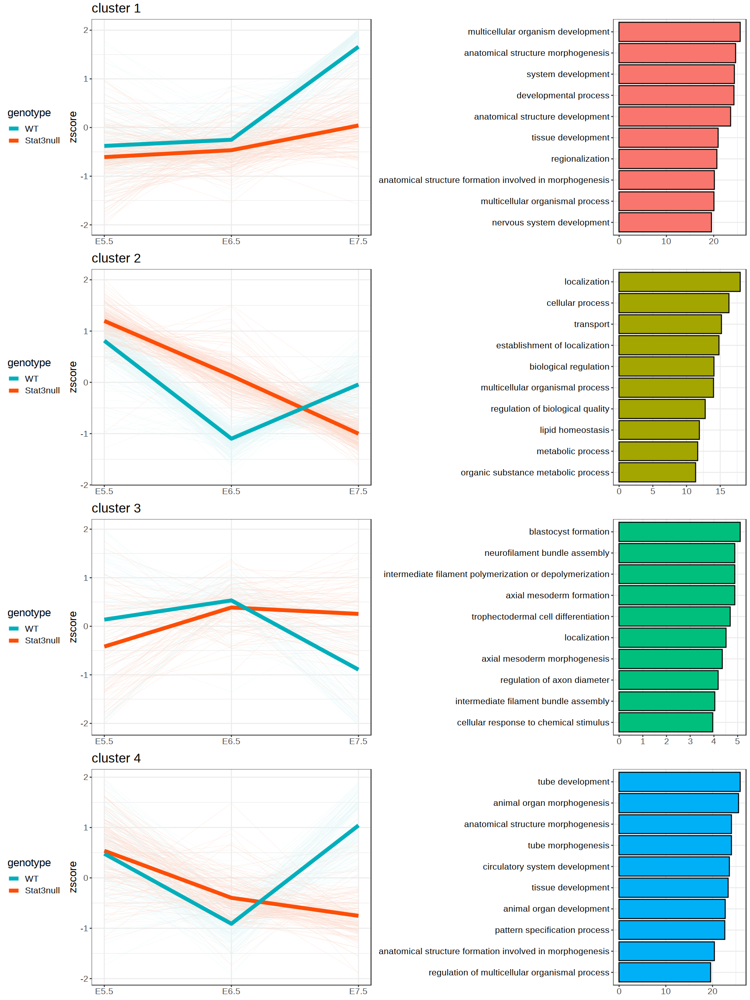

In [48]:
p_expr = ggarrange(plotlist = plots, ncol=1, align ='v')
p_go = ggarrange(plotlist = goplots, ncol=1, align ='v')
options(repr.plot.width=15, repr.plot.height=20) 

ggarrange(p_expr,p_go)

'select()' returned 1:1 mapping between keys and columns

'select()' returned 1:1 mapping between keys and columns

'select()' returned 1:1 mapping between keys and columns

'select()' returned 1:1 mapping between keys and columns

'select()' returned 1:1 mapping between keys and columns

'select()' returned 1:1 mapping between keys and columns



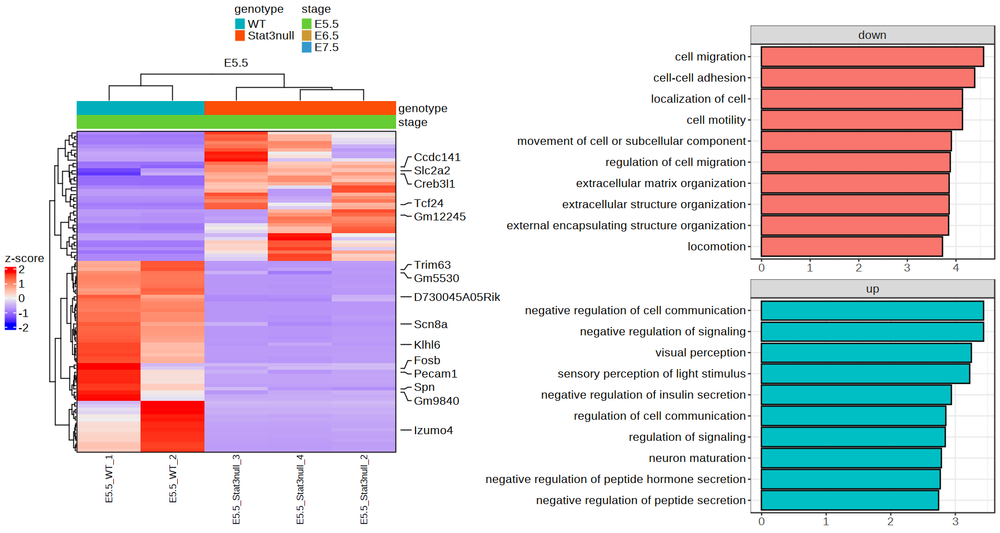

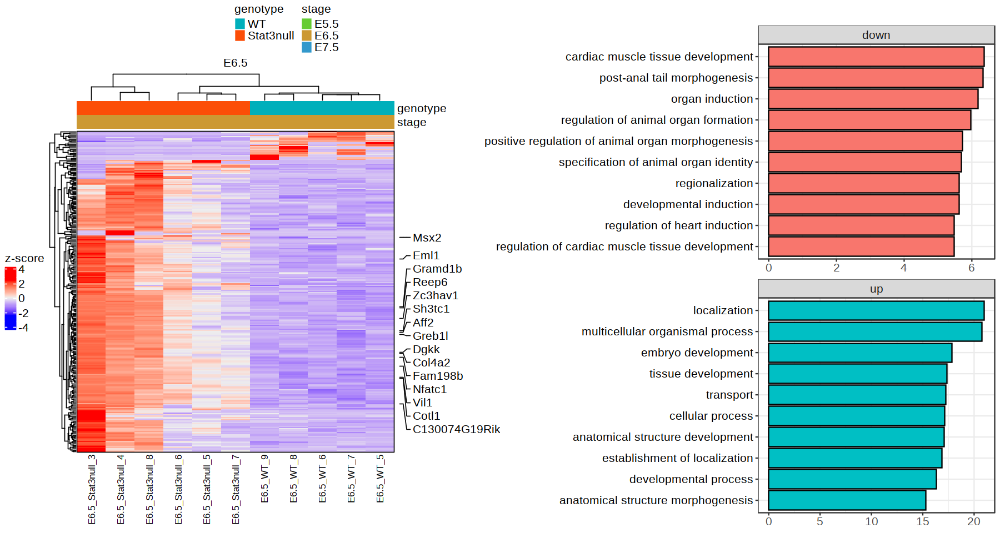

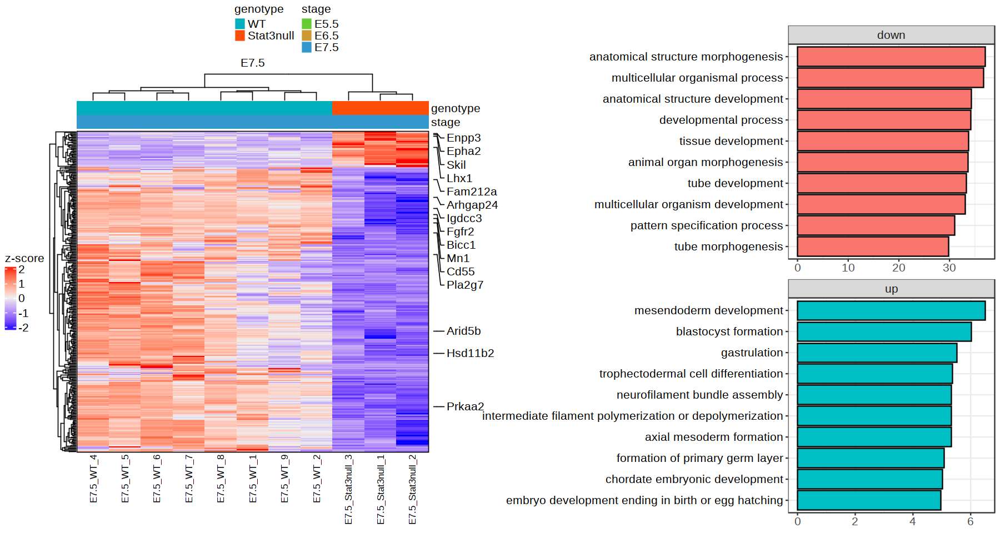

In [49]:
# Per timepoint
for(i in unique(to.plot$stage)){
tp = i
to.plot_tmp = to.plot[stage==tp & sig == TRUE]

# heatmap
heatmap.mtx = normalized_counts[unique(to.plot_tmp[sig==TRUE, gene]), grep(tp, colnames(normalized_counts))]

heatmap_scaled.mtx <- t(scale(t(heatmap.mtx)))

genes = to.plot_tmp[order(abs(logFC)),]$gene %>% head(15)
genelabs <- rowAnnotation(Genes = anno_mark(at=which(rownames(heatmap_scaled.mtx) %in% genes), labels = rownames(heatmap_scaled.mtx)[which(rownames(heatmap_scaled.mtx) %in% genes)]))

#top annotation
anno <- HeatmapAnnotation(df=colData(ddsFullE567)[colData(ddsFullE567)$stage==tp, c("genotype", "stage")], 
                          col = list(genotype=c("WT"="#00afbb", "Stat3null"="#fc4e07"), 
                                     stage=c("E5.5"="#66cc33", "E6.5"="#cc9933", "E7.5"="#3399cc")),
                          annotation_legend_param = list(title_gp = gpar(fontsize = 12),
                                                         labels_gp = gpar(fontsize = 12)))

hm = Heatmap(heatmap_scaled.mtx,
        column_title = i,
        name = "z-score", 
        top_annotation=anno,
        row_gap = unit(1, "mm"), 
        column_gap = unit(1, "mm"), 
        border = TRUE, 
        row_title_gp = gpar(fontsize = 12),
        row_names_gp = gpar(fontsize = 10), 
        column_title_gp = gpar(fontsize = 12), 
        column_names_gp = gpar(fontsize = 10),
        heatmap_legend_param = list(title_gp=gpar(fontsize = 12),
        labels_gp=gpar(fontsize = 12)
))

# GO
up = to.plot_tmp[logFC>0, gene]
entrez = mapIds(org.Mm.eg.db, up, 'ENTREZID', 'SYMBOL')
up_entrez = entrez
up_GO = as.data.table(goana(up_entrez, species="Mm"), 
                      keep.rownames=T)[order(P.DE),] %>% .[Ont=='BP'] %>% head(10) %>%
    .[,Term:=factor(Term, levels=Term)] %>%
    .[,direction:='up']

down = to.plot_tmp[logFC<0, gene]
entrez = mapIds(org.Mm.eg.db, down, 'ENTREZID', 'SYMBOL')
down_entrez = entrez
down_GO = as.data.table(goana(down_entrez, species="Mm"), 
                      keep.rownames=T)[order(P.DE),] %>% .[Ont=='BP'] %>% head(10) %>%
    .[,Term:=factor(Term, levels=Term)] %>% 
    .[,direction:='down']

GO_terms.plot = rbind(up_GO, down_GO)

GO_plot = ggplot(GO_terms.plot[order(-P.DE),][,Term:=factor(Term, levels=Term)], aes(Term, -log10(P.DE), fill=direction)) +
    geom_bar(stat='identity', col='black') + 
    coord_flip() + 
    ggtitle('') +
    theme_bw() + 
    facet_wrap(~direction, scales='free', ncol=1) + 
    theme(text=element_text(size=15),
         legend.position='none',
         axis.title.y=element_blank(),
         axis.text.y=element_text(color='black'),
         axis.title.x=element_blank())

options(repr.plot.width=15, repr.plot.height=8) 
print(ggarrange(grid.grabExpr(draw(hm + genelabs, 
                             annotation_legend_side = "top", 
                             heatmap_legend_side = "left")), 
          GO_plot))
}